## Импортируем библеотеки, качаем датасет

In [227]:
import os
import random
import torchvision
import torchmetrics
from torchmetrics.functional import char_error_rate
import torch
from sklearn import metrics
import torch.nn as nn
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm

In [3]:
!unzip 'CCPD2019-dl1.zip'

Archive:  CCPD2019-dl1.zip
   creating: CCPD2019-dl1/
   creating: CCPD2019-dl1/test/
 extracting: CCPD2019-dl1/test/0287-皖AYX440.jpg  
 extracting: CCPD2019-dl1/test/0179-皖AT105A.jpg  
 extracting: CCPD2019-dl1/test/0414-皖A005S5.jpg  
 extracting: CCPD2019-dl1/test/0346-皖AG6K96.jpg  
 extracting: CCPD2019-dl1/test/0237-皖AQ1110.jpg  
 extracting: CCPD2019-dl1/test/0446-皖SWX713.jpg  
 extracting: CCPD2019-dl1/test/0511-皖A6T013.jpg  
 extracting: CCPD2019-dl1/test/0443-皖ALV646.jpg  
 extracting: CCPD2019-dl1/test/0367-皖C23077.jpg  
 extracting: CCPD2019-dl1/test/0118-皖AZ979B.jpg  
 extracting: CCPD2019-dl1/test/0260-皖HXZ507.jpg  
 extracting: CCPD2019-dl1/test/0487-皖AL339F.jpg  
 extracting: CCPD2019-dl1/test/0515-皖ANH436.jpg  
 extracting: CCPD2019-dl1/test/0252-皖A699S9.jpg  
 extracting: CCPD2019-dl1/test/0423-皖A023J0.jpg  
 extracting: CCPD2019-dl1/test/0190-皖ATN737.jpg  
 extracting: CCPD2019-dl1/test/0538-皖A11J82.jpg  
 extracting: CCPD2019-dl1/test/0173-皖AHT260.jpg  
 extracting: C

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

## Алфавит, encoding/decoding для inputs/outputs

In [5]:
provinces = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽",
             "吉", "黑", "苏", "浙", "京", "闽", "赣", "鲁",
             "豫", "鄂", "湘", "粤", "桂", "琼", "川", "贵",
             "云", "藏", "陕", "甘", "青", "宁", "新", "警",
             "学", "O"]

ads = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H',
       'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R',
       'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z',
       '0', '1', '2', '3', '4', '5', '6', '7',
       '8', '9', 'O']

alphabet = provinces + ads 

In [6]:
OOV_TOKEN = '<OOV>'
CTC_BLANK = '<BLANK>'

class Tokenizer:

    def __init__(self, alphabet):
        self.char_map = {value: idx + 2 for (idx, value) in enumerate(alphabet)}
        self.char_map[CTC_BLANK] = 0
        self.char_map[OOV_TOKEN] = 1
        self.rev_char_map = {val: key for key, val in self.char_map.items()}

    def encode(self, word_list):
        enc_words = [self.char_map[char] if char in self.char_map
             else self.char_map[OOV_TOKEN]
             for char in word_list]
        return enc_words

    def get_num_chars(self):
        return len(self.char_map)

    def decode(self, enc_word_list):
        word_chars = ''
        for idx, char_enc in enumerate(enc_word_list):
            if (
                char_enc != self.char_map[OOV_TOKEN]
                and char_enc != self.char_map[CTC_BLANK]
                and not (idx > 0 and char_enc == enc_word_list[idx - 1])
            ):
                word_chars += self.rev_char_map[char_enc]
        return word_chars

## Класс датасета и даталоадеры + collate_fn

In [85]:
class OCRDataSet(torch.utils.data.Dataset):
    def __init__(self, data_path, names, tokenizer):
        self.data_path = data_path
        self.tokenizer = tokenizer
        self.names = names
        self.dataset = []
        self.labels = []
        self.encoded_labels = []
        self.shape = [0] * 2
        self.aug = torchvision.transforms.Compose(
            [
                torchvision.transforms.ToTensor()
                #torchvision.transforms.Normalize(mean, std)
            ]
        )
        for i in tqdm(range(len(self.names))):
            image = Image.open(self.data_path + self.names[i]).convert("RGB")
            #image = ImageOps.grayscale(image) # делал один канал, но по итогу оставил все 3
            image = image.resize((200, 32))
            image = self.aug(image)
            
            self.dataset.append(image)
            self.labels.append(self.names[i][-11:-4])
            self.encoded_labels.append(self.tokenizer.encode(self.names[i][-11:-4]))

    
    def __getitem__(self, idx):
        encoded_label = torch.LongTensor(self.encoded_labels[idx])
        return self.dataset[idx], self.labels[idx], encoded_label
    
    def __len__(self):
        return len(self.names)

In [86]:
train_path = 'CCPD2019-dl1/train/'
test_path = 'CCPD2019-dl1/test/'

train_names = os.listdir(train_path)
test_names = os.listdir(test_path)

In [87]:
tokenizer = Tokenizer(alphabet)
test = OCRDataSet(test_path, test_names, tokenizer)

100%|██████████| 9999/9999 [00:05<00:00, 1791.32it/s]


In [88]:
test[0][0].shape

torch.Size([3, 32, 200])

In [89]:
train = OCRDataSet(train_path, train_names, tokenizer)

100%|██████████| 199980/199980 [01:49<00:00, 1823.43it/s]


In [220]:
def collate_fn(batch):
    images, texts, enc_texts = zip(*batch)
    images = torch.stack(images, 0)
    enc_pad_texts = torch.nn.utils.rnn.pad_sequence(enc_texts, batch_first=True, padding_value=0)
    return images, texts, enc_pad_texts

In [145]:
train_loader = torch.utils.data.DataLoader(train,
                                          batch_size=80, 
                                          shuffle=True,
                                          collate_fn=collate_fn)

test_loader = torch.utils.data.DataLoader(test,
                                          batch_size=80, 
                                          shuffle=False,
                                          collate_fn=collate_fn)

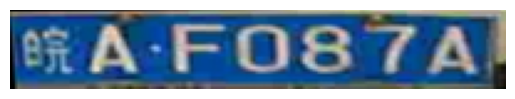

In [218]:
sample = train[4][0]
plt.axis('off')
plt.imshow(sample.permute(1, 2, 0))

## Модель:
#### CNN + BiLSTM

In [219]:
class CNNFe(nn.Module):
    def __init__(self):
        super(CNNFe, self).__init__()
        
        self.relu = nn.ReLU()
        
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        self.conv3_1 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
        self.maxpool3 = nn.MaxPool2d(kernel_size=(1,2), stride=2)
        
        self.conv5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.batchnorm2 = nn.BatchNorm2d(256)
        
        self.maxpool4 = nn.MaxPool2d(kernel_size=(1,2), stride=2)
        self.conv6 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=2, stride=1, padding=0)

    def forward(self, x):
        
        x = self.relu(self.conv1(x))
        x = self.maxpool1(x)
        x = self.relu(self.conv3_1(x))
        x = self.maxpool3(x)
        x = self.relu(x)
        x = self.relu(self.conv5(x))
        x = self.batchnorm2(x)
        x = self.maxpool4(x)
        x = self.relu(self.conv6(x))
        
        return x

In [221]:
class BiLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, dropout=0.15):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size, hidden_size, num_layers,
            dropout=dropout, batch_first=True, bidirectional=True)

    def forward(self, x):
        out, _ = self.lstm(x)
        return out


class CRNN(nn.Module):
    def __init__(
        self, number_class_symbols, time_feature_count=21, lstm_hidden=100,
        lstm_len=2,
    ):
        super().__init__()
        self.feature_extractor = CNNFe() 
        self.avg_pool = nn.AdaptiveAvgPool2d(
            (time_feature_count, time_feature_count))
        self.bilstm = BiLSTM(time_feature_count, lstm_hidden, lstm_len)
        self.classifier = nn.Sequential(
            nn.Linear(lstm_hidden * 2, time_feature_count),
            nn.GELU(),
            nn.Dropout(0.1),
            nn.Linear(time_feature_count, number_class_symbols)
        )

    def forward(self, x):
        x = self.feature_extractor(x)
        b, c, h, w = x.size()
        x = x.view(b, c * h, w)
        x = self.avg_pool(x)
        x = x.transpose(1, 2)
        x = self.bilstm(x)
        x = self.classifier(x)
        x = x.permute(1, 0, 2)
        x = nn.functional.log_softmax(x, dim=2)
        return x

## Инициализация модели и функции тренировки и валидации
взял интересный шедулер, который нашел в одной из реализаций CTC-loss, он при ухудшении/не изменении loss-а, понижает lr

In [223]:
model = CRNN(tokenizer.get_num_chars())
criterion = torch.nn.CTCLoss(blank=0, reduction='mean', zero_infinity=True)
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, factor=0.5, patience=2, verbose=True
)

In [224]:
a = model(test[0][0].unsqueeze(0))
a.shape # time_feature x batch x vocab_size

torch.Size([21, 1, 70])

In [149]:
def train_epoch(model, train_loader, optimizer, criterion):
    epoch_loss = 0
    total_step = len(train_loader)
    model.train(True)
    model.to(device)
    for i, (images, labels, encoded_labels) in enumerate(train_loader):

        batch_s = images.shape[0]
        images = images.to(device)
        labels = labels
        encoded_labels = encoded_labels.to(device)
        outputs = model(images)

        input_lengths = torch.full(
                size=(batch_s,), fill_value=outputs.size(0), dtype=torch.long
        )
        target_lengths = torch.full(
            size=(batch_s,), fill_value=encoded_labels.size(1), dtype=torch.long
        )

        loss = criterion(
            outputs, encoded_labels, input_lengths, target_lengths
        )

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        
    return epoch_loss / total_step

In [150]:
def val_epoch(model, test_loader):
    epoch_loss = 0
    preds = []
    total_step = len(test_loader)
    model.train(False)
    model.to(device)
    for i, (images, labels, encoded_labels) in enumerate(test_loader):
        with torch.no_grad():
            batch_s = images.shape[0]
            images = images.to(device)
            labels = labels
            encoded_labels = encoded_labels.to(device)
            outputs = model(images)

            input_lengths = torch.full(
                    size=(batch_s,), fill_value=outputs.size(0), dtype=torch.long
            )
            target_lengths = torch.full(
                size=(batch_s,), fill_value=encoded_labels.size(1), dtype=torch.long
            )

            loss = nn.CTCLoss(blank=0)(
                outputs, encoded_labels, input_lengths, target_lengths
            )
            epoch_loss += loss.item()
            preds.extend(outputs.argmax(2).T)
            
    return epoch_loss / total_step, preds

## Тренируем модель

In [152]:
epoches = 8
real_test = np.array(test.labels)
real_train = np.array(train.labels)
for i in tqdm(range(epoches)):
    decoded = []
    train_loss = train_epoch(model, train_loader, optimizer, criterion)
    test_loss, val_preds = val_epoch(model, test_loader)
    test_answers = np.array(list(map(output_decoder, val_preds)))
    acc = (real_test == test_answers).sum() / 9999
    
    scheduler.step(test_loss)
    print(f'Epoch: {i + 1}; Train_loss: {train_loss}; Test_loss: {test_loss};\n Eval Accuracy: {acc}')

 12%|█▎        | 1/8 [00:31<03:42, 31.85s/it]

Epoch: 1; Train_loss: 1.4445627773061396; Test_loss: 0.08145601834356785;
 Eval Accuracy: 0.9227922792279228


 25%|██▌       | 2/8 [01:03<03:11, 31.92s/it]

Epoch: 2; Train_loss: 0.050318637614697216; Test_loss: 0.05008460974507034;
 Eval Accuracy: 0.9482948294829483


 38%|███▊      | 3/8 [01:34<02:37, 31.51s/it]

Epoch: 3; Train_loss: 0.022383602664619685; Test_loss: 0.05896603828109801;
 Eval Accuracy: 0.9442944294429443


 50%|█████     | 4/8 [02:06<02:06, 31.52s/it]

Epoch: 4; Train_loss: 0.014354023332661017; Test_loss: 0.04447990398062393;
 Eval Accuracy: 0.9581958195819582


 62%|██████▎   | 5/8 [02:37<01:34, 31.46s/it]

Epoch: 5; Train_loss: 0.010359219936467707; Test_loss: 0.04937885725963861;
 Eval Accuracy: 0.9566956695669567


 75%|███████▌  | 6/8 [03:09<01:03, 31.70s/it]

Epoch: 6; Train_loss: 0.007967271547275596; Test_loss: 0.03719611611129949;
 Eval Accuracy: 0.9657965796579658


 88%|████████▊ | 7/8 [03:41<00:31, 31.79s/it]

Epoch: 7; Train_loss: 0.006686707442335319; Test_loss: 0.03595945307274815;
 Eval Accuracy: 0.9660966096609661


100%|██████████| 8/8 [04:13<00:00, 31.71s/it]

Epoch: 8; Train_loss: 0.005419347418146208; Test_loss: 0.03350106073304778;
 Eval Accuracy: 0.9706970697069707


## Получим предикты на тест выборку

In [151]:
def output_decoder(output):
    output = output
    output = output.tolist()
    output = tokenizer.decode(output)
    return output

In [153]:
loss, test_preds = val_epoch(model, test_loader)

In [154]:
comparation_test = np.array(test.labels)
test_answers = np.array(list(map(output_decoder, test_preds)))

#### Посчитаем Accuracy

In [155]:
(test_answers == comparation_test).sum() / 9999

0.9706970697069707

#### Посчитаем CER

In [228]:
char_error_rate(test_answers, comparation_test).item()

0.005386252887547016

#### Посмотрим на результаты и на "плохие" картинки

In [229]:
df = pd.DataFrame({"true": comparation_test,  "predict": test_answers}, index=np.arange(9999))

df['Errors in predict'] = ''

for i in range(df.shape[0]):
    ref = df.loc[i, "true"]
    output = df.loc[i, "predict"]
    df.loc[i, 'Errors in predict'] = int(char_error_rate(output, ref).item() * 7)

df = df.sort_values(by = 'Errors in predict', ascending=False)
df.head(10)

,true,predict,Errors in predict
3791,皖AK927W,皖44,6
2025,皖AG2Z62,皖AW5QQ,5
1750,皖A2W003,皖A6JFF4,5
1684,皖AMQ059,苏ANNK59,4
5885,皖Q99066,皖0LQ0066,4
8458,皖AJ915C,皖AM51EZ,4
6953,皖AYU642,皖LU1A2,4
3417,皖AN8N55,皖AQU55,3
6381,皖AZ7M69,皖A469,3
7004,皖AG737T,皖GZ37ZT,3


In [210]:
def show_image(image_name):
    img = Image.open(test_path + image_name)
    return img

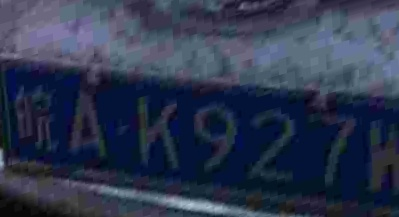

In [211]:
show_image('1609-皖AK927W.jpg')

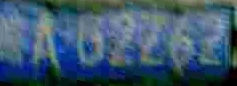

In [212]:
show_image('0374-皖AG2Z62.jpg')

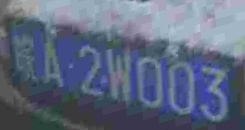

In [213]:
show_image('0607-皖A2W003.jpg')

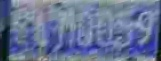

In [214]:
show_image('0201-皖AMQ059.jpg')

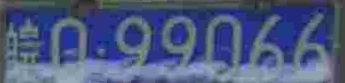

In [215]:
show_image('0388-皖Q99066.jpg')

## Выводы
#### Результаты довольно хорошие, на 1000 символов модель дак мы видим - сэмплы с плохим распознаванием либо плохо задетекчены, либо с плохим качеством, либо часть текста отсвечивает.
#### Что можно сделать?
##### 1. Подобрать хорошие аугментации, чтобы модель меньше ошибалась на плохо обрезанных фото
##### 2. Дополнительно пройтись детектором как раз для таких семплов
##### 3. Вместо LSTM попробовать Transformer, вместо CTC-loss попробовать CE-loss
##### 4. Естественно, потюнить параметры, можно и выход модельки потюнить, во время последних экспериментов оставил 21 (в 3 раза больше чем символов в названии, для бланков хватит)
##### 5. Можно заметить, что модель плохо определяет текст на картинках, где текст под каким-либо углом, т.е. ее надо дополнительно обучать на такие семплы, которые можно достать с помощью аугментаций